In [1]:
from google.colab import drive
import os
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# Joe's cell
DRIVE_PATH = '/content/drive/MyDrive/Cal/Colab/DeepMusicVisualizer'

In [ ]:
# Richard's cell
DRIVE_PATH = 'TODO'

In [3]:
SYM_PATH = '/content/DeepMusicVisualizer'
if not os.path.exists(SYM_PATH):
  !ln -s $DRIVE_PATH $SYM_PATH

In [4]:
# LSD requirements.txt encompasses dependencies for StyleGAN2

LSD_PATH = os.path.join(SYM_PATH, 'lucid_sonic_dreams/requirements.txt')
! pip install -r $LSD_PATH

     |████████████████████████████████| 412.3MB 37kB/s 
     |████████████████████████████████| 3.1MB 53.5MB/s 
     |████████████████████████████████| 512kB 49.0MB/s 
     |████████████████████████████████| 51kB 7.6MB/s 
     |████████████████████████████████| 3.8MB 45.6MB/s 
     |████████████████████████████████| 1.9MB 54.3MB/s 
  Created wheel for gast: filename=gast-0.2.2-cp37-none-any.whl size=7540 sha256=771bf707e9006366ed604b26d4b28dc8d875ca367d24169ad4397c564a67554c
  Stored in directory: /root/.cache/pip/wheels/5c/2e/7e/a1d4d4fcebe6c381f378ce7743a3ced3699feb89bcfbdadadd
Successfully built gast
ERROR: tensorflow-probability 0.12.1 has requirement gast>=0.3.2, but you'll have gast 0.2.2 which is incompatible.
  Found existing installation: tensorflow-estimator 2.4.0
    Uninstalling tensorflow-estimator-2.4.0:
      Successfully uninstalled tensorflow-estimator-2.4.0
  Found existing installation: gast 0.3.3
    Uninstalling gast-0.3.3:
      Successfully uninstalled gast-0.3.3

In [5]:
import sys
sys.path.append(SYM_PATH)
from google.colab import files
import pickle 

sys.path.append(os.path.join(SYM_PATH, 'stylegan2'))
# os.chdir('stylegan2')
import dnnlib
import dnnlib.tflib as tflib
from dnnlib.tflib.tfutil import * 
# os.chdir(cwd)

from IPython.display import Image 
import PIL.Image

%load_ext autoreload
%autoreload 2

In [6]:
style = os.path.join(SYM_PATH, 'data/VisionaryArt.pkl')

# _G, _D, Gs = pretrained_networks.load_networks(style)
stream = open(style, 'rb')
tflib.init_tf()
with stream:
    G, D, Gs = pickle.load(stream, encoding='latin1')



In [13]:
print(Gs.components)
print(G.components)

{'synthesis': <dnnlib.tflib.network.Network object at 0x7f96ef957ed0>, 'mapping': <dnnlib.tflib.network.Network object at 0x7f96ee5f3310>}
{'synthesis': <dnnlib.tflib.network.Network object at 0x7f96ee5d30d0>, 'mapping': <dnnlib.tflib.network.Network object at 0x7f96ef94b710>}


z: [[ 2.25446563 -0.76595715 -0.92782535 -0.77943554  1.27084657 -1.13029639
  -3.36285761  0.07851193  0.66969664  0.85968025  1.1842223  -1.0431641
   0.41536472 -0.41121042 -0.38599019 -0.10807362  0.3114344  -1.16769191
  -1.18408215  0.36960376 -1.14962665  0.25023703  1.31783672  2.02232423
  -0.28217628  0.48433775  0.93782411 -0.7117611   0.17632292 -1.63684231
  -0.00772303  0.71297659  1.34289048  1.80619106 -1.0520146   0.04098804
  -2.19285615  0.90140916  0.1665119   0.03211186 -0.30082453  2.1506175
   0.29965595  0.66894337  0.79790441 -0.36108435  0.63224522  1.4460649
   0.73366295  0.11305596 -0.08754318 -1.3448919   0.94311387 -0.1846524
   0.30864114  0.83091245 -1.10402205 -0.04083902 -1.44475341 -0.16324214
   1.1231422  -0.93972233 -0.99331295 -1.63901577  0.32487112  0.32019903
  -2.62244796 -0.83763094  0.31321488 -1.4017139  -0.28495338 -0.37651564
   0.73358036  1.30141304  0.5245638   0.06060146 -1.66309033 -0.35863905
  -0.36568728 -0.72910105  0.10971846 -

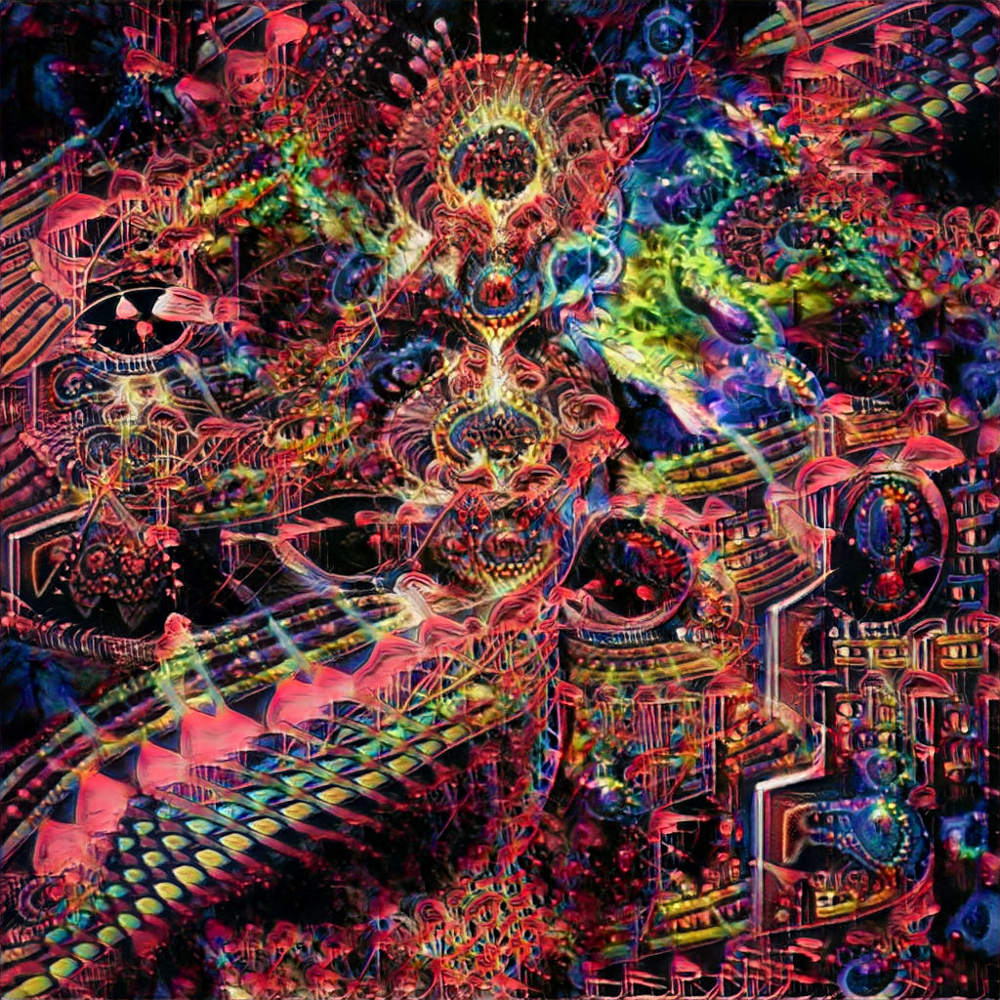

z: [[-6.75511465e-01 -1.57793175e+00  5.45801060e-01 -9.08239068e-01
  -1.09008310e+00  5.12065959e-01 -1.37273193e-01 -2.20666443e-01
  -6.07026399e-01 -4.88874015e-01 -6.07038306e-02 -1.65532346e-01
   5.44574639e-01 -8.83732480e-01  7.15716535e-01 -1.32387687e-01
  -2.10508920e+00  1.17275907e+00 -1.58099400e-01  9.22890197e-02
   5.36360684e-02  6.36221705e-01  4.08824054e-01  2.92060476e+00
   1.33243586e+00 -1.80694523e-01  7.06198915e-01  5.32669917e-01
   5.21303867e-01 -7.47993058e-01  2.15964741e-01  1.55854859e-01
   8.13033163e-01 -7.95670233e-01 -6.21860185e-01  1.00343752e+00
  -2.00556153e+00  2.16580650e-01  8.88206394e-01  1.52353732e+00
   1.29627421e-01  6.93528292e-01  3.19937493e-01 -7.05423823e-01
  -1.34907042e+00 -1.48642725e+00  1.35339050e+00 -2.14018337e+00
  -5.77974455e-01 -8.63002023e-01 -2.91382210e-01  6.29396271e-01
   3.58664077e-02 -1.13151094e+00 -2.73074081e-01  5.69926031e-02
  -2.68734735e+00 -1.96202801e+00  6.16505421e-01 -6.03100515e-03
   1.67

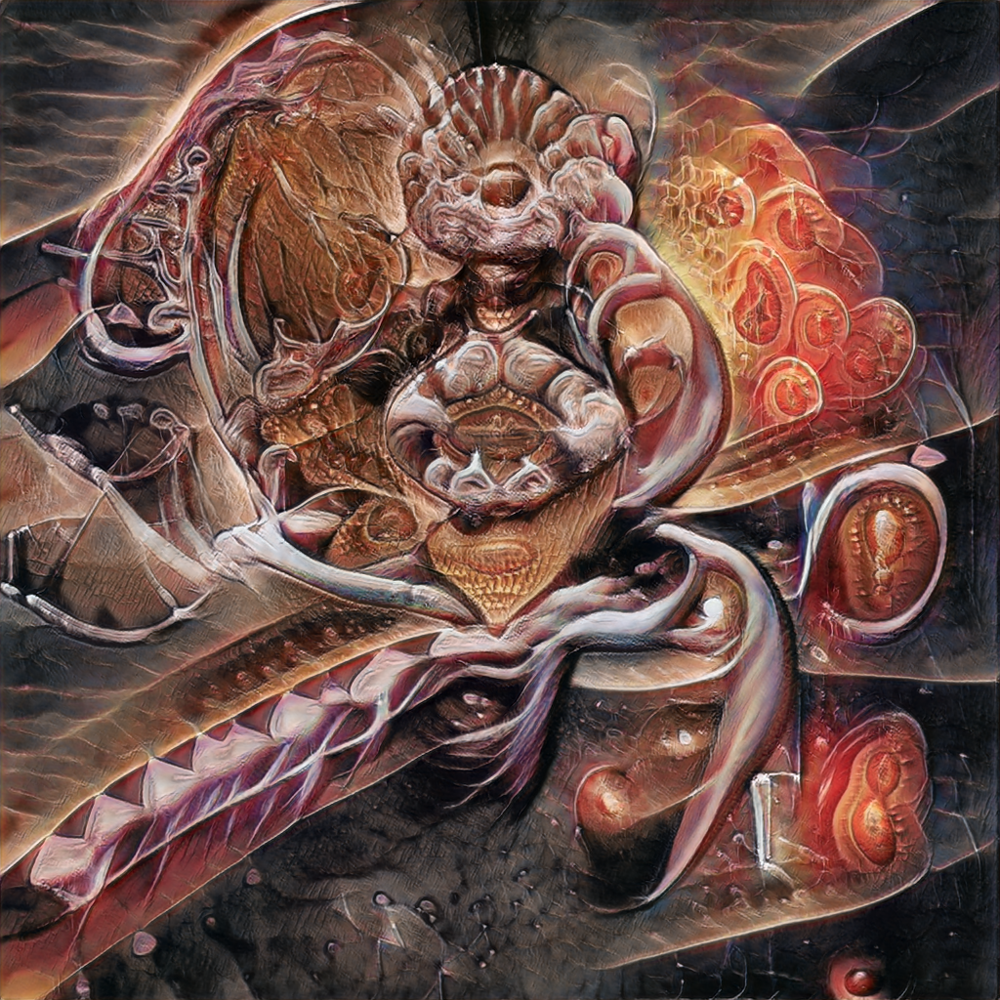

z: [[ 0.75893249 -0.41207028 -0.45465521  0.09285505  0.26788611 -0.68864866
   1.32946377 -0.44950521 -0.18966132  0.82020034 -1.45713449  0.01297775
  -1.68511029  1.28361114  0.4674781   0.1093023   0.58458304  0.06410605
   0.38405267 -0.4269835  -0.47474005 -0.21480097 -0.40551596 -0.42754759
   0.50905318  0.32160466 -1.75271768 -1.32665867  1.87078424 -1.81583207
  -0.31650522 -0.56977098  0.2649953   1.20667305 -1.00806769  2.39064307
  -0.64303281 -0.93884347 -0.93673453 -0.39799866  0.09192351 -1.0312115
   0.31118527  1.38435726 -0.39124799  0.79653131  1.39240607  0.26944811
  -1.03251705 -0.85836596  1.79887403  0.46398817 -0.29495223 -1.42475555
   0.41367086 -0.24522781  0.24696146 -0.82406865  0.32977438 -0.03412183
  -0.937891   -0.0355434   0.45417787 -0.54421377  0.5618783   0.27922339
   0.41139697 -1.18150511  0.3506538   0.11938566  1.66058304 -0.98702357
   1.33290725 -0.54069371 -1.21364306  0.62787527 -1.24048928  1.57986725
   1.41593931 -0.31868617  0.1615118

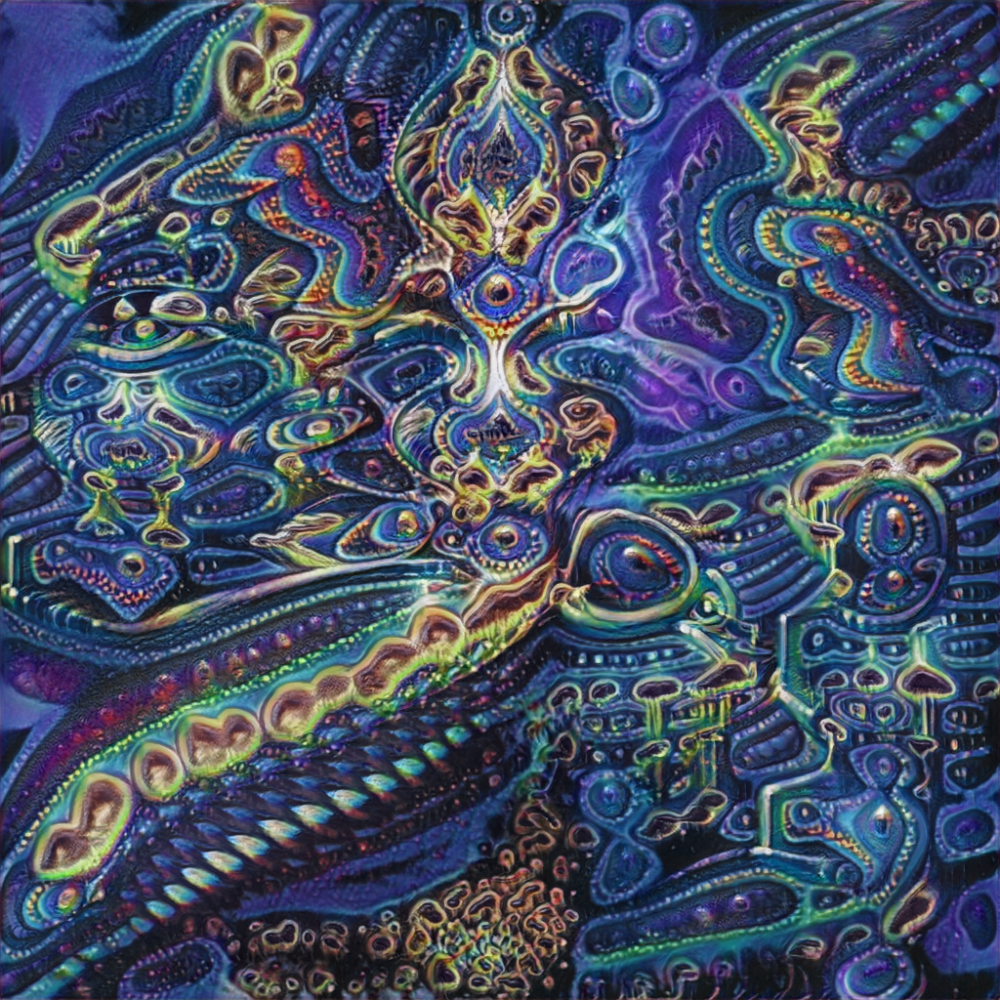

z: [[-0.67531637  0.57742772  1.06247706 -0.65990583  0.10358733  0.61507742
   0.36703017  0.13729609 -0.65350908  0.50667826  0.0497022   0.41895699
  -0.13787437  0.04229846  0.94926739  0.73412958  0.62641879  0.47123641
  -1.5056099  -0.13033098  0.93420096 -0.60369296  0.01238732 -0.56240343
  -1.01683943 -0.0533235  -2.75530793 -0.05682617  1.54314222  1.81497054
   0.74903984 -0.34514351 -1.16674517  0.04286474 -0.28414952  0.08219834
  -0.28154838 -0.45046164  0.25514497 -0.11425056 -0.10312948 -0.51503663
   0.51305988  1.43885628  0.24897722  1.12703743 -0.81946952  1.25098693
  -0.41095319  1.44776554  0.80637787 -0.35473483  0.53487848  0.81827688
  -0.20295172  0.09870884 -0.16526955  1.83481979  1.20878086  0.5001535
  -0.1212342  -0.62165444  0.19602514  0.2468877  -1.13356442 -1.16432795
  -0.31142877 -0.44102596  1.01534655 -0.52608567 -1.64265534 -0.35872919
   1.12128756 -0.33679918 -0.30592133 -0.24588115 -1.73639632 -0.92558588
  -0.92535124  1.4800672  -0.2422294

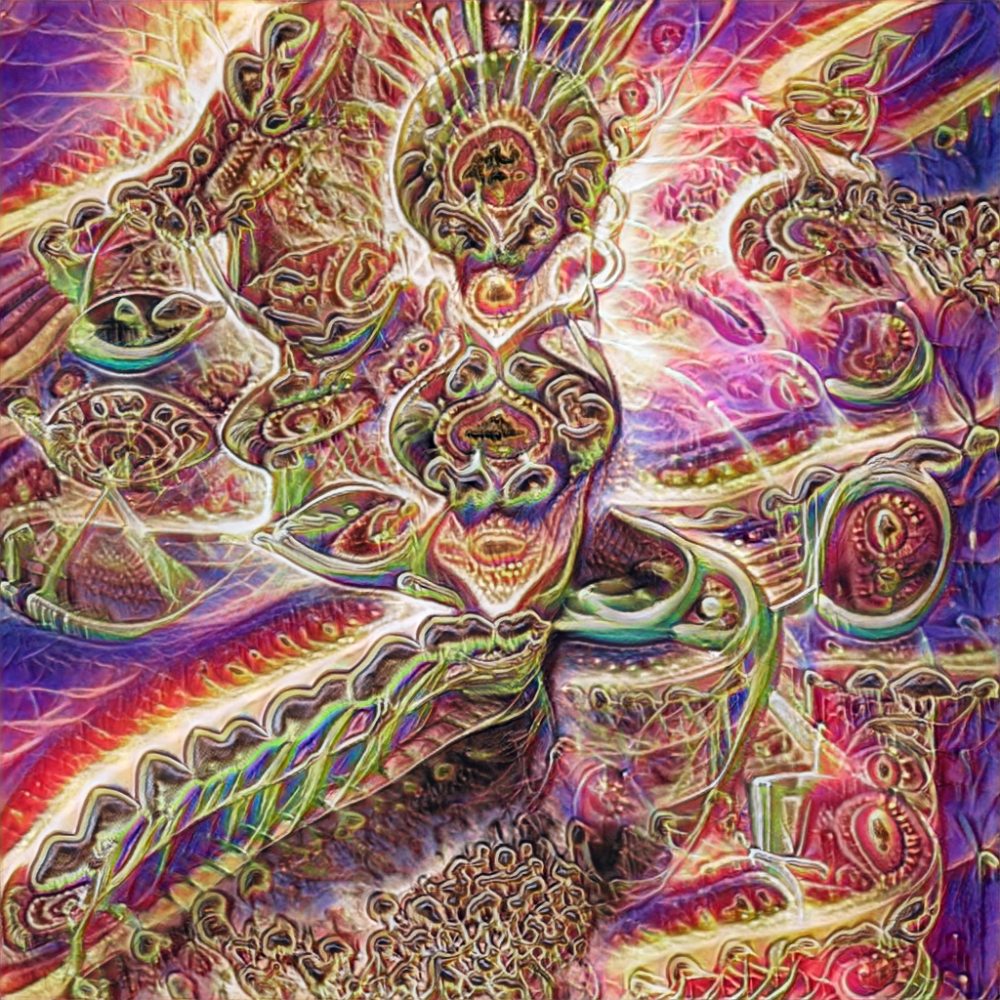

z: [[ 1.22327524e+00  1.81379242e-01  1.79902622e+00 -6.05114145e-01
  -3.43135847e-01  8.75475076e-01 -3.90082196e-01  4.06907156e-01
  -2.18319064e-01  3.14447509e-01 -1.03921178e+00  4.96526470e-01
   1.58276186e+00  7.17377107e-01 -2.43111083e-01  2.28341952e+00
  -3.13780615e-01  7.40610035e-01  4.83161227e-01  1.11253832e+00
   1.29661069e+00  4.84948297e-01 -7.45229388e-01  1.18772337e+00
  -9.86779863e-01  5.27397946e-01  9.42355330e-01 -5.58161245e-01
   1.69323925e-01  5.42942661e-01 -4.85324196e-01  6.68904655e-01
   3.81037172e-01 -1.96959257e-01 -1.57687216e+00  1.62844663e+00
   1.80316427e+00  6.53281220e-01  6.87048390e-01  1.27161328e+00
  -1.43844423e+00 -1.05959248e+00  1.05814341e+00  5.64075564e-01
  -1.04065959e+00  8.23228887e-01  1.30650415e+00 -7.87726812e-01
  -8.78157084e-01  1.01578307e-01 -4.38815686e-01  1.59527064e+00
  -6.07355962e-01 -4.62334974e-01 -1.15032599e+00  8.45076206e-02
  -1.94272263e-01  5.14341209e-01  4.92723830e-02 -1.03119513e+00
  -1.63

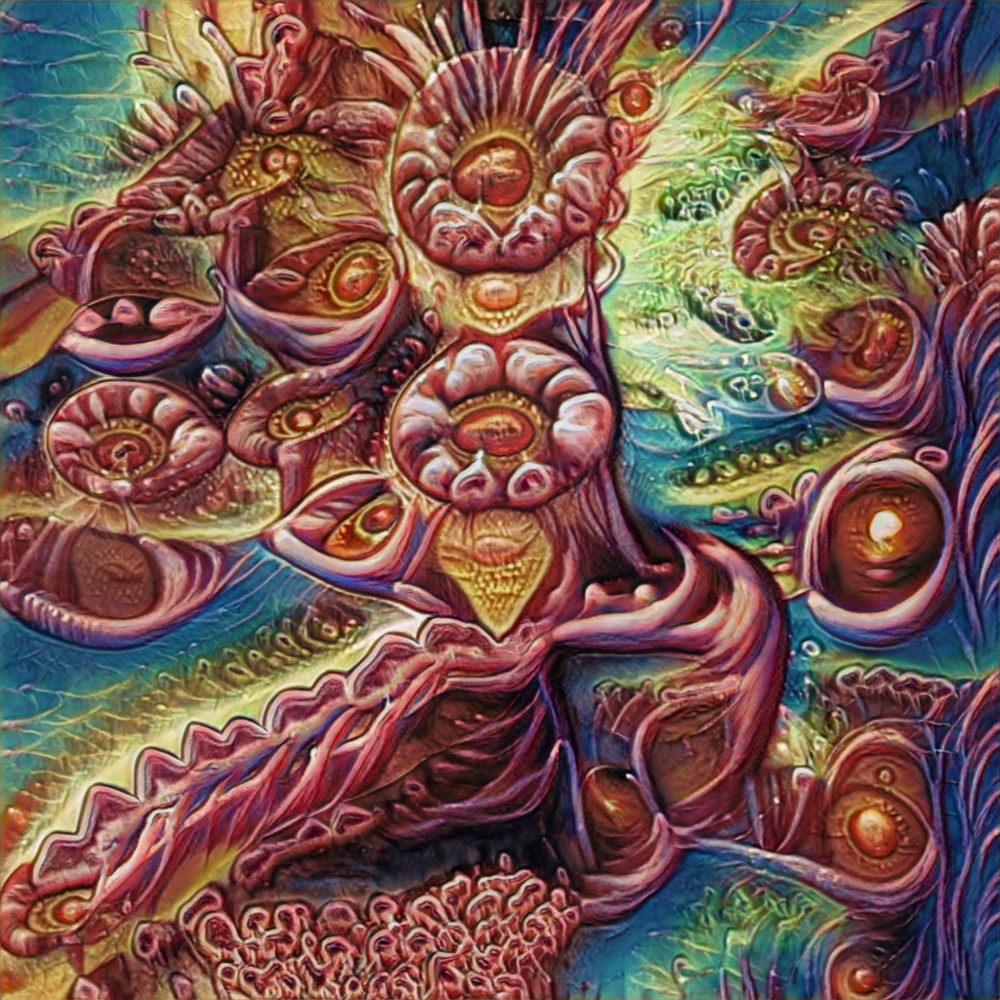

zero z: [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0

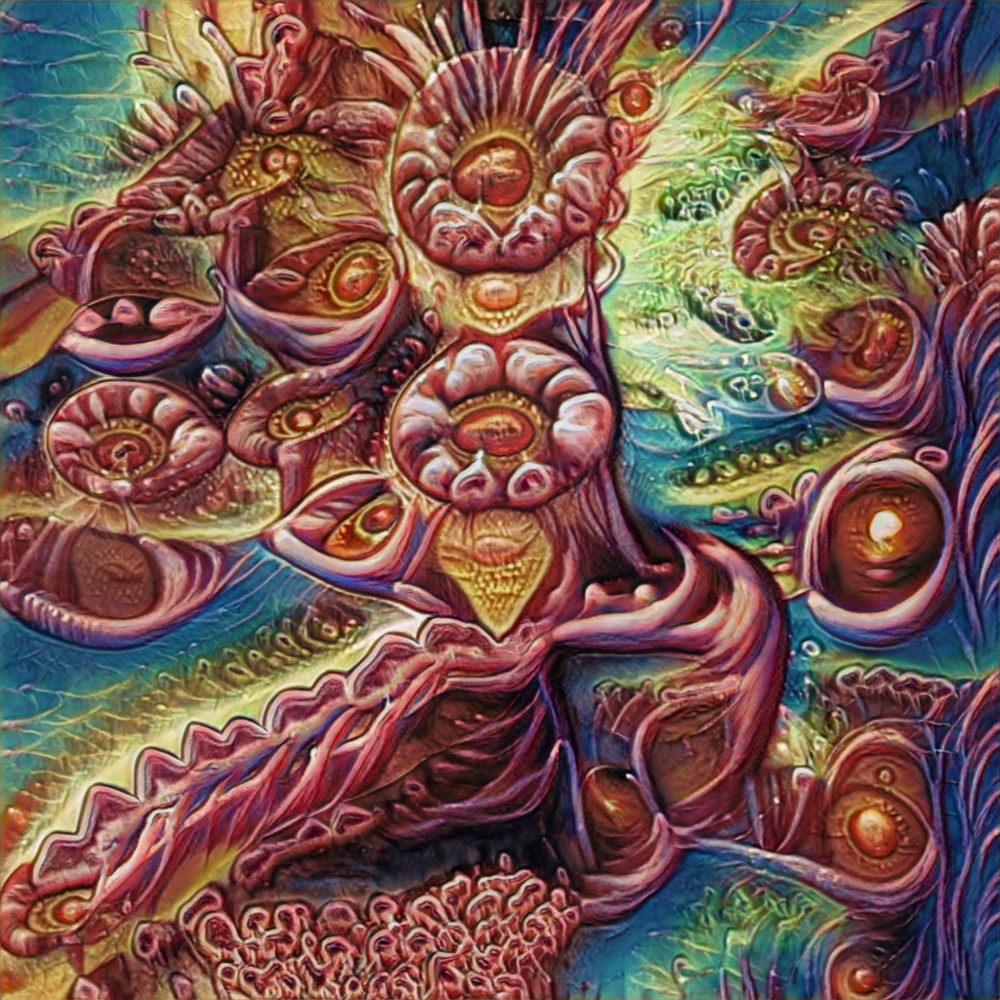

In [ ]:
noise_vars = [var for name, var in Gs.components.synthesis.vars.items() if name.startswith('noise')]

Gs_kwargs = dnnlib.EasyDict()
Gs_kwargs.output_transform = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
Gs_kwargs.randomize_noise = False

seeds = [420, 2021]
rnd = np.random.RandomState(420)
tflib.set_vars({var: rnd.randn(*var.shape.as_list()) for var in noise_vars}) # [height, width]

for i in range(5):
  z = rnd.randn(1, *Gs.input_shape[1:]) # [minibatch, component]
  images = Gs.run(z, None, **Gs_kwargs) # [minibatch, height, width, channel]
  print('z:', z)
  display(PIL.Image.fromarray(images[0], 'RGB'))

z = np.zeros((1, *Gs.input_shape[1:]))
image = Gs.run(z, None, **Gs_kwargs)
print('zero z:', z)
display(PIL.Image.fromarray(images[0], 'RGB'))

# for seed_idx, seed in enumerate(seeds):
#     print('Generating image for seed %d (%d/%d) ...' % (seed, seed_idx, len(seeds)))
#     rnd = np.random.RandomState(seed)
#     z = rnd.randn(1, *Gs.input_shape[1:]) # [minibatch, component]
#     images = Gs.run(z, None, **Gs_kwargs) # [minibatch, height, width, channel]
#     print('z:', z)
#     display(PIL.Image.fromarray(images[0], 'RGB'))
#     # PIL.Image.fromarray(images[0], 'RGB').save(dnnlib.make_run_dir_path('seed%04d.png' % seed))

In [ ]:
print(noise_vars)

[<tf.Variable 'G_synthesis_1/noise0:0' shape=(1, 1, 4, 4) dtype=float32_ref>, <tf.Variable 'G_synthesis_1/noise1:0' shape=(1, 1, 8, 8) dtype=float32_ref>, <tf.Variable 'G_synthesis_1/noise2:0' shape=(1, 1, 8, 8) dtype=float32_ref>, <tf.Variable 'G_synthesis_1/noise3:0' shape=(1, 1, 16, 16) dtype=float32_ref>, <tf.Variable 'G_synthesis_1/noise4:0' shape=(1, 1, 16, 16) dtype=float32_ref>, <tf.Variable 'G_synthesis_1/noise5:0' shape=(1, 1, 32, 32) dtype=float32_ref>, <tf.Variable 'G_synthesis_1/noise6:0' shape=(1, 1, 32, 32) dtype=float32_ref>, <tf.Variable 'G_synthesis_1/noise7:0' shape=(1, 1, 64, 64) dtype=float32_ref>, <tf.Variable 'G_synthesis_1/noise8:0' shape=(1, 1, 64, 64) dtype=float32_ref>, <tf.Variable 'G_synthesis_1/noise9:0' shape=(1, 1, 128, 128) dtype=float32_ref>, <tf.Variable 'G_synthesis_1/noise10:0' shape=(1, 1, 128, 128) dtype=float32_ref>, <tf.Variable 'G_synthesis_1/noise11:0' shape=(1, 1, 256, 256) dtype=float32_ref>, <tf.Variable 'G_synthesis_1/noise12:0' shape=(1, 